# Naive Beyes

## 1. Tree-based classification

#### 1.1. Step 1: Importing data

In [1]:
import pandas as pd 
#import dataset 'credit'
fileurl = "data/creditdata.csv"
credit = pd.read_csv(fileurl)

In [2]:
credit.head() #sample dataset content

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
0,1,1,18,4,2,1049,1,2,4,2,...,4,2,21,3,1,1,3,1,1,1
1,1,1,9,4,0,2799,1,3,2,3,...,2,1,36,3,1,2,3,2,1,1
2,1,2,12,2,9,841,2,4,2,2,...,4,1,23,3,1,1,2,1,1,1
3,1,1,12,4,0,2122,1,3,3,3,...,2,1,39,3,1,2,2,2,1,2
4,1,1,12,4,0,2171,1,3,4,3,...,4,2,38,1,2,2,2,1,1,2


In [3]:
credit.describe()    #exploratory stats

,Creditability,Account Balance,Duration of Credit (month),Payment Status of Previous Credit,Purpose,Credit Amount,Value Savings/Stocks,Length of current employment,Instalment per cent,Sex & Marital Status,...,Duration in Current address,Most valuable available asset,Age (years),Concurrent Credits,Type of apartment,No of Credits at this Bank,Occupation,No of dependents,Telephone,Foreign Worker
count,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.00000,...,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.700000,2.577000,20.903000,2.54500,2.828000,3271.24800,2.105000,3.384000,2.973000,2.68200,...,2.845000,2.358000,35.54200,2.675000,1.928000,1.407000,2.904000,1.155000,1.404000,1.037000
std,0.458487,1.257638,12.058814,1.08312,2.744439,2822.75176,1.580023,1.208306,1.118715,0.70808,...,1.103718,1.050209,11.35267,0.705601,0.530186,0.577654,0.653614,0.362086,0.490943,0.188856
min,0.000000,1.000000,4.000000,0.00000,0.000000,250.00000,1.000000,1.000000,1.000000,1.00000,...,1.000000,1.000000,19.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,1.000000,12.000000,2.00000,1.000000,1365.50000,1.000000,3.000000,2.000000,2.00000,...,2.000000,1.000000,27.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
50%,1.000000,2.000000,18.000000,2.00000,2.000000,2319.50000,1.000000,3.000000,3.000000,3.00000,...,3.000000,2.000000,33.00000,3.000000,2.000000,1.000000,3.000000,1.000000,1.000000,1.000000
75%,1.000000,4.000000,24.000000,4.00000,3.000000,3972.25000,3.000000,5.000000,4.000000,3.00000,...,4.000000,3.000000,42.00000,3.000000,2.000000,2.000000,3.000000,1.000000,2.000000,1.000000
max,1.000000,4.000000,72.000000,4.00000,10.000000,18424.00000,5.000000,5.000000,4.000000,4.00000,...,4.000000,4.000000,75.00000,3.000000,3.000000,4.000000,4.000000,2.000000,2.000000,2.000000


#### 1.2. Step 2: Splitting data

In [4]:
#column explanations
credit.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Creditability                      1000 non-null   int64
 1   Account Balance                    1000 non-null   int64
 2   Duration of Credit (month)         1000 non-null   int64
 3   Payment Status of Previous Credit  1000 non-null   int64
 4   Purpose                            1000 non-null   int64
 5   Credit Amount                      1000 non-null   int64
 6   Value Savings/Stocks               1000 non-null   int64
 7   Length of current employment       1000 non-null   int64
 8   Instalment per cent                1000 non-null   int64
 9   Sex & Marital Status               1000 non-null   int64
 10  Guarantors                         1000 non-null   int64
 11  Duration in Current address        1000 non-null   int64
 12  Most valuable availab

In [5]:
#variable of interest/ dependant variable
target = credit['Creditability']

In [6]:
#factors of Creditability
target.value_counts()

1    700
0    300
Name: Creditability, dtype: int64

In [7]:
credit.isna().sum()

Creditability                        0
Account Balance                      0
Duration of Credit (month)           0
Payment Status of Previous Credit    0
Purpose                              0
Credit Amount                        0
Value Savings/Stocks                 0
Length of current employment         0
Instalment per cent                  0
Sex & Marital Status                 0
Guarantors                           0
Duration in Current address          0
Most valuable available asset        0
Age (years)                          0
Concurrent Credits                   0
Type of apartment                    0
No of Credits at this Bank           0
Occupation                           0
No of dependents                     0
Telephone                            0
Foreign Worker                       0
dtype: int64

# Q1: What is your suggestion if you see any NA values?

- If the dataset has NA values, we can temporarily mask those rows to skip them for the analysis. 
- Later we can impute the NA entries with mean and re-run the analysis.

In [14]:
#Method 2
from sklearn.model_selection import train_test_split 
y = target 
X = credit.drop(['Creditability'],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12345)

In [15]:
y_train.value_counts()/750

1    0.698667
0    0.301333
Name: Creditability, dtype: float64

In [16]:
y_test.value_counts()/250

1    0.704
0    0.296
Name: Creditability, dtype: float64

# Q2: Compute  the  percentage  of  both  classes  similar  to  what  you  did  in  lab  1  and  see  if  the distribution of both classes preserved for both training and testing data.

 - Using random state = 123, we see that the classes were almost preserved. 71-29 in training data and 66-34 in testing data. We see a 5% difference.
 - Using random state = 12345, we see this difference reduces from 5% to less than 1%. So we stick with this

#### 1.3. Step 3: Training the model on data

In [17]:
# Design Naive Beyes classifier
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model = model.fit(X_train, y_train)

#### 1.4. Step 4: Evaluating performance of the model

In [18]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 

y_predict = model.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 
print(accuracy_score(y_test, y_predict)*100)

[[ 48  26]
 [ 39 137]]
74.0


# Q1: If you see the accuracy of 100%, what does it mean? Does this mean that we design a perfect model? This is some thing that needs more discussion. Write a few sentences about accuracy of 100%.

Our model is __65%__ accurate. <br>
If a model was found to be 100% accurate, it might mean one of sevaral different things: <br>
(i) The model may be overfitted to the dataset. Any value outside this dataset will produce bad outcome.
(ii) It is a simple problem. i.e. There is a small finite set of values the predictor variables can take. All these cases have been captured once if not several times in the training. So the test results are very accurate <br>
(iii) The testing dataset is a subset of training dataset either by mistake or otherwise <br>
(iv) There is a large correlation between one of the predictors and the variable of interest, both of which are factors rather than continuous variables

## 2. Random Forest

#### 2.1. Step 3&4: Train model and Evaluate metrics

In [17]:
from sklearn.ensemble import RandomForestClassifier 
clf = RandomForestClassifier() 
clf.fit(X_train, y_train) 

y_predict = clf.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 
print(accuracy_score(y_test, y_predict)*100)

[[ 36  36]
 [ 22 156]]
76.8


# Q2: What are the three most important features in this model?

The 3 most important features of the model are: <br>
(i) Size of the split between Training vs Testing datasets <br>
(ii) The predictor variables selected (to avoid multicollinearity)<br>
(iii) The random seed selection

#### 2.2. Rerun model with different random seed

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=23458)
clf = RandomForestClassifier() 
clf.fit(X_train, y_train) 

y_predict = clf.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 
print(accuracy_score(y_test, y_predict)*100)

[[ 33  40]
 [ 19 158]]
76.4


## 3. Adding regression to trees

#### 3.1. Step 1: Importing data

In [19]:
fileurl = "data/whitewines.csv"
wine = pd.read_csv(fileurl) 
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,6.7,0.62,0.24,1.10,0.039,6.0,62.0,0.99340,3.41,0.32,10.400000,5
1,5.7,0.22,0.20,16.00,0.044,41.0,113.0,0.99862,3.22,0.46,8.900000,6
2,5.9,0.19,0.26,7.40,0.034,33.0,123.0,0.99500,3.49,0.42,10.100000,6
3,5.3,0.47,0.10,1.30,0.036,11.0,74.0,0.99082,3.48,0.54,11.200000,4
4,6.4,0.29,0.21,9.65,0.041,36.0,119.0,0.99334,2.99,0.34,10.933333,6


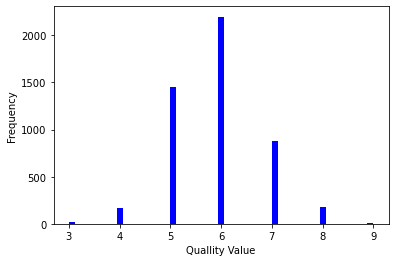

In [20]:
import matplotlib.pyplot as plt
# An "interface" to matplotlib.axes.Axes.hist() method 
n, bins, patches = plt.hist(x=wine['quality'], bins='auto', color='b', ) 
plt.xlabel('Quallity Value') 
plt.ylabel('Frequency') 
plt.show()

#### 3.2. Step 2: Splitting data

In [21]:
from sklearn.model_selection import train_test_split 
y = wine["quality"] 
X = wine.drop(['quality'],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=12321)

#### 3.3. Step 3: Train the model on data

In [22]:
# Design decision tree 
from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier 
model = tree.DecisionTreeClassifier() 
model = model.fit(X_train, y_train)

In [23]:
from IPython.display import SVG
from graphviz import Source 
from IPython.display import display

tree.export_graphviz(model, out_file='tree.dot', 
                                    feature_names=X.columns,
                                    filled=True)

In [24]:

dot_data = tree.export_graphviz(model, out_file=None,
                                feature_names=X.columns, 
                                filled=True, rounded=True, 
                                special_characters=True) 
graph = Source(dot_data) 
graph

#### 3.4. Step 4: Evaluating model performance

In [25]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 

y_predict = model.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 
print(accuracy_score(y_test, y_predict)*100)

[[  0   0   4   1   0   0   0]
 [  0  12  18  13   4   0   0]
 [  1  14 228 107  18   1   0]
 [  4  13  97 324  84   8   0]
 [  1   0   9  84 116  11   0]
 [  0   0   3  12  16  21   0]
 [  0   0   0   0   1   0   0]]
57.224489795918366


In [26]:
import numpy as np
np.corrcoef(y_test,y_predict)

array([[1.        , 0.55572422],
       [0.55572422, 1.        ]])

In [27]:
accuracy_score(y_test, y_predict)*100

57.224489795918366

In [28]:
from sklearn.metrics import mean_squared_error 
RMSE = mean_squared_error(y_predict, y_test)**0.5 
RMSE

0.8475655413823614

# Q3- What is your interpretation about this amount of RMSE?

RMSE is the standard deviation of the error terms or residuals.<br>
Since we are predicting quality which ranges from 3 to 9, RMSE of 0.85 is not good enough<br>
It is 14% of mean. That is a large error to be ignored.

## 4. Apply decision tree on News popularity dataset

#### 4.1. Step 1: Import data

In [30]:
import pandas as pd 
#import dataset 'news popularity'
fileurl = "data/OnlineNewsPopularity_for_python.csv"
newspop = pd.read_csv(fileurl)

In [31]:
newspop.head()

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,...,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-...,731,12,219,0.663594,1.0,0.815385,4,2,1,...,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-spon...,731,9,255,0.604743,1.0,0.791946,3,1,1,...,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billio...,731,9,211,0.575130,1.0,0.663866,3,1,1,...,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre...,731,9,531,0.503788,1.0,0.665635,9,0,1,...,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731,13,1072,0.415646,1.0,0.540890,19,19,20,...,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


In [32]:
newspop.shape[0]

39644

In [33]:
mid_shares = newspop['shares'].median()
mid_shares

1400.0

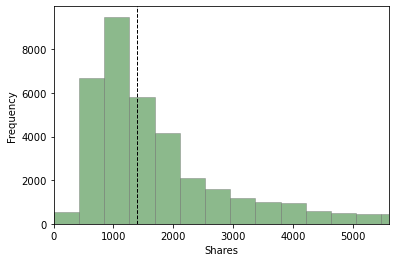

In [34]:
import matplotlib.pyplot as plt
# An "interface" to matplotlib.axes.Axes.hist() method 
x=newspop['shares']
n, bins, patches = plt.hist(x, bins=2000, color='darkgreen',edgecolor='grey', alpha=0.45 ) 
plt.xlabel('Shares') 
plt.ylabel('Frequency') 
plt.xlim(left=0,right=5600)
plt.axvline(x.median(), color='black', linestyle='dashed', linewidth=1)
plt.show()

In [35]:
target = newspop['shares']
popular = (target >= mid_shares)

In [36]:
popular.head()

0    False
1    False
2     True
3    False
4    False
Name: shares, dtype: bool

#### 4.2. Step 2: Split data

In [37]:
from sklearn.model_selection import train_test_split  
X = newspop.drop(['url','timedelta','shares'],axis=1)
y = popular

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=52125)

#### 4.3. Step 3: Train model on data - Decision Tree

In [38]:
from sklearn import tree 
from sklearn.tree import DecisionTreeClassifier 
model = tree.DecisionTreeClassifier() 
model = model.fit(X_train, y_train)

In [39]:
from IPython.display import SVG
from graphviz import Source 
from IPython.display import display

tree.export_graphviz(model, out_file='poptree.dot', 
                                    feature_names=X.columns,
                                    filled=True)

dot_data = tree.export_graphviz(model, out_file=None,
                                feature_names=X.columns, 
                                filled=True, rounded=True, 
                                special_characters=True) 
graph = Source(dot_data) 
graph

#### 4.4 Step 4: Evaluate model performance - Decision Tree

In [40]:
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import accuracy_score 

y_predict = model.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 
print(accuracy_score(y_test, y_predict)*100)

[[2462 2134]
 [2016 3299]]
58.12733326606801


In [41]:
import numpy as np
np.corrcoef(y_test,y_predict)

array([[1.        , 0.15669644],
       [0.15669644, 1.        ]])

#### 4.5. Step 3&4: Training model and Evaluating - Random Forest

In [43]:
from sklearn.ensemble import RandomForestClassifier 
clf = RandomForestClassifier() 
clf.fit(X_train, y_train) 

y_predict = clf.predict(X_test) 
print(confusion_matrix(y_test, y_predict)) 

[[2715 1881]
 [1427 3888]]


In [44]:
print(accuracy_score(y_test, y_predict)*100)

66.62294420341036


# Q4: Try decision tree and random forest and evaluate the model

Decision Tree model performs at __58%__ accuracy compared to Random Forest model which performs at __66%__ accuracy in predicting the popularity that a certain news article will receive